In [4]:
import numpy as np
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt

In [5]:
df = pd.read_csv("./data/user_user.txt",sep=" ") # open file
df.info() 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5048994 entries, 0 to 5048993
Data columns (total 5 columns):
 #   Column           Dtype 
---  ------           ----- 
 0   userA            object
 1   userB            object
 2   friends          int64 
 3   friendship_date  object
 4   hora             object
dtypes: int64(1), object(4)
memory usage: 192.6+ MB


In [3]:
G = nx.from_pandas_edgelist(df,"userA", "userB",create_using=nx.Graph) # Create network from data_frame

In [6]:
print(G.edges())

[('vitoon', 1), (1, 'taric_uchiha'), (1, 'kellymoons'), (1, 'littlejaxit'), (1, 'caki-chan'), (1, 'duduchu'), (1, 'stefanzik'), (1, '-reitetsu-'), (1, 'tiagofalken'), (1, 'julianneinjapan'), (1, 'ry0_4suk4'), (1, 'blast00'), (1, 'xtorin'), (1, 'perrypig123'), (1, 'korhime'), (1, 'michael_alexis'), (1, 'barhuuus'), (1, 'blandhoe'), (1, 'twice_0412'), (1, 'angel_himitsu_66'), (1, 'atashiwa'), (1, 'tyson_taehyung'), (1, 'dyed'), (1, 'lana_5305'), (1, 'arradum'), (1, 'prior'), (1, 'animiya'), (1, 'edwin000'), (1, 'thomas12'), (1, 'faithhealer'), (1, 'exgaper'), (1, 'booren'), (1, 'captain_tree'), (1, 'ana1234567'), (1, 'shirachan'), (1, 'lebanka'), (1, '__-nightmare-__'), (1, 'ethernia'), (1, 'kaljeung'), (1, 'king_of_voices'), (1, 'arklightsh'), (1, 'iyori'), (1, 'misterneb'), (1, 'winterrxseowo'), (1, 'iyukky'), (1, 'lunarstargirl345'), (1, 'xmyst_'), (1, 'emperorkaido'), (1, 'lu_kun257'), (1, 'nanumilk'), (1, 'noilma'), (1, 'cheeseofdespair'), (1, 'hikona'), (1, 'saksham20092002'), (1, 

## Esta igual ao notebook da marvel

In [7]:


number_nodes_k = []                             # List of number of nodes (k_core)
k_core = []                                     # List of all k_core
degree_list = [v for d,v in G.degree()]         # List of degree for all nodes
nodes_G = [v for v in G.nodes()]                # List of all nodes in original network

In [8]:
dict_k_core = {}                                # Will save all sites in each k_core
# np.unique select just single values in degree_list
for i in np.unique(degree_list):
    G_ = nx.k_core(G,k=i)                       # Define subgraph from k_core
    dict_k_core[f"k_core_{i}"] = [v for v in G_.nodes()]
    k_core.append(i)                            # Update k_core list
    number_nodes_k.append(G_.number_of_nodes()) # Select number of nodes in subgraph
    if(G_.number_of_nodes()==0):
        G_.clear()                                  
        break
    G_.clear()                                  # Delete subgraph of memory 

## Talvez o seja um grafo trivial/discreto

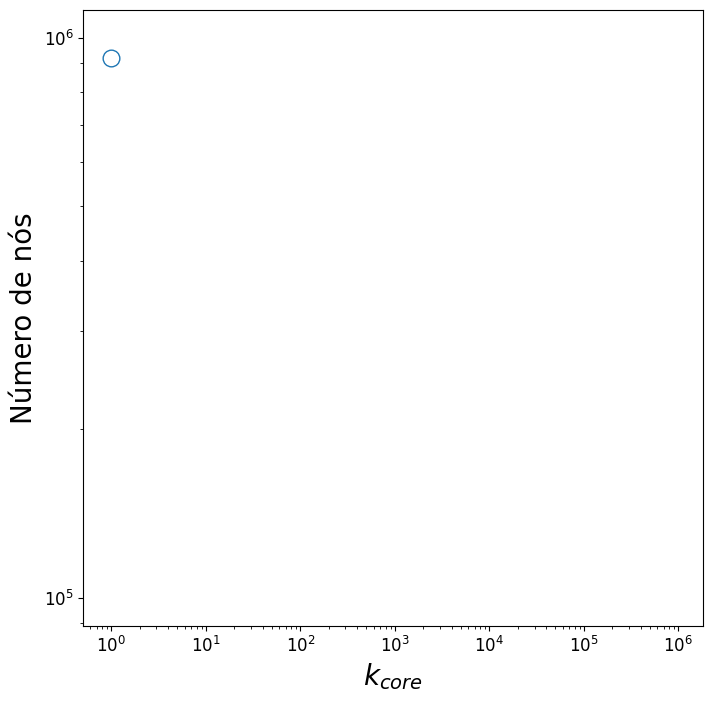

In [11]:
# Plot number_of_nodes(k_core)
plt.figure(figsize=(8,8))
ms = 12
plt.plot(k_core,number_nodes_k,'o',ms=ms,mec=None,markerfacecolor='w')
plt.xscale("log")
plt.yscale("log")
plt.ylabel("Número de nós",fontsize=20)
plt.xlabel(r"$k_{core}$",fontsize=20)
plt.xticks(fontsize=12)  
plt.yticks(fontsize=12)  
plt.show()